In [29]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

In [30]:
# using SQLite Table to read data.
con = sqlite3.connect('C:/Users/SKS/Desktop/AAIC/database.sqlite') 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3""", con) 

# Give reviews with Score>3 a positive rating(1), and reviews with a score<3 a negative rating(0).
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (525814, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [31]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [32]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B007Y59HVM,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ET0,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B007Y59HVM,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ET0,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBE1U,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


In [33]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B006P7E5ZI,"undertheshrine ""undertheshrine""",1334707200,5,I was recommended to try green tea extract to ...,5


In [34]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [35]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [36]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [37]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(364173, 10)

In [38]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

69.25890143662969

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [39]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [40]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [41]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(364171, 10)


1    307061
0     57110
Name: Score, dtype: int64

In [42]:
final=final.iloc[:50000,:]

#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [43]:
# printing some random reviews
sent_0 = final['Text'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Text'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Text'].values[1500]
print(sent_1500)
print("="*50)

sent_4900 = final['Text'].values[4900]
print(sent_4900)
print("="*50)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college
I was really looking forward to these pods based on the reviews.  Starbucks is good, but I prefer bolder taste.... imagine my surprise when I ordered 2 boxes - both were expired! One expired back in 2005 for gosh sakes.  I admit that Amazon agreed to credit me for cost plus part of shipping, but geez, 2 years expired!!!  I'm hoping to find local San Diego area shoppe that carries pods so that I can try something different than starbucks.
Great ingredients although, chicken should have been 1st rather than chicken broth, the only thing I do not think belongs in it is Canola oil. Canola or rapeseed is not someting a do

In [44]:
# remove urls from text python: https://stackoverflow.com/a/40823105/4084039
sent_0 = re.sub(r"http\S+", "", sent_0)
sent_1000 = re.sub(r"http\S+", "", sent_1000)
sent_150 = re.sub(r"http\S+", "", sent_1500)
sent_4900 = re.sub(r"http\S+", "", sent_4900)

print(sent_0)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college


In [45]:
# https://stackoverflow.com/questions/16206380/python-beautifulsoup-how-to-remove-all-tags-from-an-element
from bs4 import BeautifulSoup

soup = BeautifulSoup(sent_0, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1000, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1500, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_4900, 'lxml')
text = soup.get_text()
print(text)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college
I was really looking forward to these pods based on the reviews.  Starbucks is good, but I prefer bolder taste.... imagine my surprise when I ordered 2 boxes - both were expired! One expired back in 2005 for gosh sakes.  I admit that Amazon agreed to credit me for cost plus part of shipping, but geez, 2 years expired!!!  I'm hoping to find local San Diego area shoppe that carries pods so that I can try something different than starbucks.
Great ingredients although, chicken should have been 1st rather than chicken broth, the only thing I do not think belongs in it is Canola oil. Canola or rapeseed is not someting a do

In [46]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [47]:
sent_1500 = decontracted(sent_1500)
print(sent_1500)
print("="*50)

Great ingredients although, chicken should have been 1st rather than chicken broth, the only thing I do not think belongs in it is Canola oil. Canola or rapeseed is not someting a dog would ever find in nature and if it did find rapeseed in nature and eat it, it would poison them. Today is Food industries have convinced the masses that Canola oil is a safe and even better oil than olive or virgin coconut, facts though say otherwise. Until the late 70 is it was poisonous until they figured out a way to fix that. I still like it but it could be better.


In [48]:
#remove words with numbers python: https://stackoverflow.com/a/18082370/4084039
sent_0 = re.sub("\S*\d\S*", "", sent_0).strip()
print(sent_0)

this witty little book makes my son laugh at loud. i recite it in the car as we're driving along and he always can sing the refrain. he's learned about whales, India, drooping roses:  i love all the new words this book  introduces and the silliness of it all.  this is a classic book i am  willing to bet my son will STILL be able to recite from memory when he is  in college


In [49]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent_1500 = re.sub('[^A-Za-z0-9]+', ' ', sent_1500)
print(sent_1500)

Great ingredients although chicken should have been 1st rather than chicken broth the only thing I do not think belongs in it is Canola oil Canola or rapeseed is not someting a dog would ever find in nature and if it did find rapeseed in nature and eat it it would poison them Today is Food industries have convinced the masses that Canola oil is a safe and even better oil than olive or virgin coconut facts though say otherwise Until the late 70 is it was poisonous until they figured out a way to fix that I still like it but it could be better 


In [50]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [51]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(final['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())

100%|██████████████████████████████████████████████████████████████████████████| 50000/50000 [00:19<00:00, 2582.07it/s]


In [53]:
preprocessed_reviews[276]

''

In [26]:
len(preprocessed_reviews)

50000

# [4] Featurization

## [4.1] BAG OF WORDS

In [28]:
#BoW
count_vect = CountVectorizer() #in scikit-learn
bow=count_vect.fit_transform(preprocessed_reviews)
print("some feature names ", count_vect.get_feature_names()[:10])
print('='*50)


some feature names  ['aa', 'aaa', 'aaaa', 'aaaaa', 'aaaaaaaaaaaaa', 'aaaaaaaaagghh', 'aaaaaah', 'aaaaah', 'aaah', 'aaahs']


## [4.3] TF-IDF

In [29]:
tf_idf_vect = TfidfVectorizer( min_df=10)
tfidf=tf_idf_vect.fit_transform(preprocessed_reviews)
print("some sample features(unique words in the corpus)",tf_idf_vect.get_feature_names()[0:10])
print('='*50)

final_tf_idf = tf_idf_vect.transform(preprocessed_reviews)
print("the type of count vectorizer ",type(final_tf_idf))
print("the shape of out text TFIDF vectorizer ",final_tf_idf.get_shape())
print("the number of unique words including both unigrams and bigrams ", final_tf_idf.get_shape()[1])

some sample features(unique words in the corpus) ['abandon', 'abdominal', 'ability', 'able', 'abroad', 'absence', 'absent', 'absolute', 'absolutely', 'absolutley']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text TFIDF vectorizer  (50000, 8731)
the number of unique words including both unigrams and bigrams  8731


## [4.4] Word2Vec

In [30]:
# Train your own Word2Vec model using your own text corpus
i=0
list_of_sentance=[]
for sentance in preprocessed_reviews:
    list_of_sentance.append(sentance.split())

In [31]:
# Using Google News Word2Vectors

# in this project we are using a pretrained model by google
# its 3.3G file, once you load this into your memory 
# it occupies ~9Gb, so please do this step only if you have >12G of ram
# we will provide a pickle file wich contains a dict , 
# and it contains all our courpus words as keys and  model[word] as values
# To use this code-snippet, download "GoogleNews-vectors-negative300.bin" 
# from https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit
# it's 1.9GB in size.


# http://kavita-ganesan.com/gensim-word2vec-tutorial-starter-code/#.W17SRFAzZPY
# you can comment this whole cell
# or change these varible according to your need

is_your_ram_gt_16g=False
want_to_use_google_w2v = False
want_to_train_w2v = True

if want_to_train_w2v:
    # min_count = 5 considers only words that occured atleast 5 times
    w2v_model=Word2Vec(list_of_sentance,min_count=5,size=50, workers=4)
    print(w2v_model.wv.most_similar('great'))
    print('='*50)
    print(w2v_model.wv.most_similar('worst'))
    
elif want_to_use_google_w2v and is_your_ram_gt_16g:
    if os.path.isfile('GoogleNews-vectors-negative300.bin'):
        w2v_model=KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
        print(w2v_model.wv.most_similar('great'))
        print(w2v_model.wv.most_similar('worst'))
    else:
        print("you don't have gogole's word2vec file, keep want_to_train_w2v = True, to train your own w2v ")

[('fantastic', 0.8286808133125305), ('excellent', 0.8121867775917053), ('awesome', 0.8104792833328247), ('terrific', 0.8087725043296814), ('good', 0.801118791103363), ('wonderful', 0.7924963235855103), ('perfect', 0.7439908981323242), ('amazing', 0.6965333223342896), ('nice', 0.6625303030014038), ('yummy', 0.646131157875061)]
[('greatest', 0.8136374354362488), ('best', 0.7608320713043213), ('tastiest', 0.6854872703552246), ('nicest', 0.6730852127075195), ('closest', 0.663906455039978), ('nastiest', 0.6607229709625244), ('experienced', 0.653356671333313), ('disgusting', 0.6526445746421814), ('awful', 0.6115931272506714), ('misfortune', 0.6012171506881714)]


In [32]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  13694
sample words  ['witty', 'little', 'book', 'makes', 'son', 'laugh', 'loud', 'car', 'driving', 'along', 'always', 'sing', 'learned', 'india', 'roses', 'love', 'new', 'words', 'classic', 'willing', 'bet', 'still', 'able', 'memory', 'college', 'remember', 'seeing', 'show', 'television', 'years', 'ago', 'child', 'sister', 'later', 'bought', 'day', 'thirty', 'something', 'used', 'series', 'books', 'songs', 'student', 'teaching', 'turned', 'whole', 'school', 'purchasing', 'cd', 'children']


## [4.4.1] Converting text into vectors using Avg W2V, TFIDF-W2V

#### [4.4.1.1] Avg W2v

In [33]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

100%|███████████████████████████████████████████████████████████████████████████| 50000/50000 [02:19<00:00, 357.17it/s]


50000
50


#### [4.4.1.2] TFIDF weighted W2v

In [34]:
import pickle
# average Word2Vec
# compute average word2vec for each review.
if os.path.isfile('tfidf_sent_vectors.pkl'):
    with open('tfidf_sent_vectors.pkl', 'rb') as f:
        tfidf_sent_vectors= pickle.load(f)
else:
    model = TfidfVectorizer()
    tf_idf_matrix = model.fit_transform(preprocessed_reviews)
    # we are converting a dictionary with word as a key, and the idf as a value
    dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))
    # TF-IDF weighted Word2Vec
    tfidf_feat = model.get_feature_names() # tfidf words/col-names
    # final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

    tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
    row=0;
    for sent in tqdm(list_of_sentance): # for each review/sentence 
        sent_vec = np.zeros(50) # as word vectors are of zero length
        weight_sum =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words and word in tfidf_feat:
                vec = w2v_model.wv[word]
    #             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
                # to reduce the computation we are 
                # dictionary[word] = idf value of word in whole courpus
                # sent.count(word) = tf valeus of word in this review
                tf_idf = dictionary[word]*(sent.count(word)/len(sent))
                sent_vec += (vec * tf_idf)
                weight_sum += tf_idf
        if weight_sum != 0:
            sent_vec /= weight_sum
        tfidf_sent_vectors.append(sent_vec)
        row += 1
    with open('tfidf_sent_vectors.pkl', 'wb') as f:
        pickle.dump(tfidf_sent_vectors, f)

### [5.1.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

In [35]:
bow.shape

(50000, 42333)

100%|███████████████████████████████████████████████████████████████████████████████| 10/10 [1:47:10<00:00, 739.77s/it]


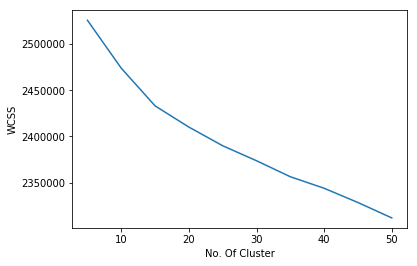

In [36]:
# Please write all the code with proper documentation
from sklearn.cluster import KMeans
wcss=[]
for i in tqdm(range(5,51,5)):
    kmeans=KMeans(n_clusters=i,random_state=0)
    kmeans.fit(bow)
    wcss.append(kmeans.inertia_)
plt.plot(range(5,51,5),wcss)
plt.xlabel('No. Of Cluster')
plt.ylabel('WCSS')
plt.show()  

#### As the plot b/w no. of cluster and within cluster sum square distance still decreasing till 50 clusters so we are taking n_cluster=30

In [41]:
from sklearn.cluster import KMeans
kmeans=KMeans(n_clusters=30,random_state=0)
kmeans.fit(bow)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=30, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=0, tol=0.0001, verbose=0)

In [42]:
d={'Text':preprocessed_reviews,'Label':kmeans.labels_}
df=pd.DataFrame(data=d)
df.groupby(['Label']).count()

,Text
Label,
0,997
1,278
2,521
3,5737
4,797
5,23
6,960
7,8
8,112


#### Cluster 27 has the maximum reviews 10784

### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

In [43]:
# Please write all the code with proper documentation
from nltk.tokenize import word_tokenize
# Function to plot word_cloud for given cluster 
def word_cloud_cluster(cluster): 
    words=''
    df_cluster=df[df['Label']==cluster]['Text']
    for i in df_cluster:
        for i in word_tokenize(i):
            words=words+i
            words=words+' '
    from wordcloud import WordCloud
    wordcloud = WordCloud(width = 1500, height = 1500, background_color ='white', min_font_size = 10).generate(words) 

    # plot the WordCloud image                        
    plt.figure(figsize = (8, 8)) 
    plt.imshow(wordcloud) 
    plt.axis("off")
    plt.title("Cluster {}".format(cluster))
    plt.show() 

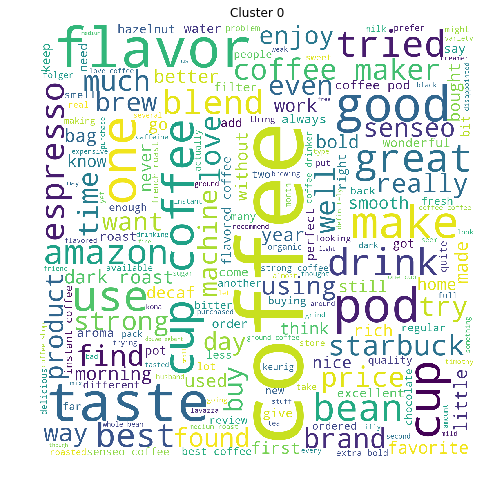

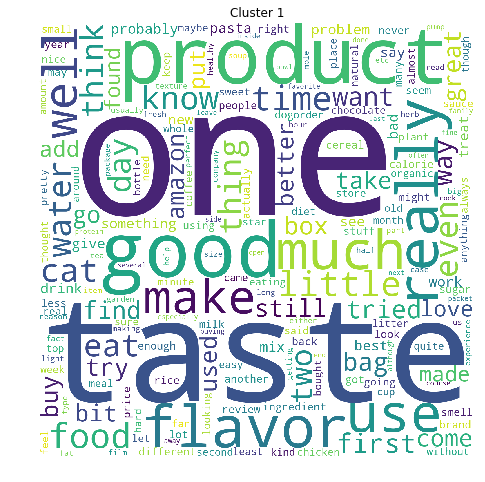

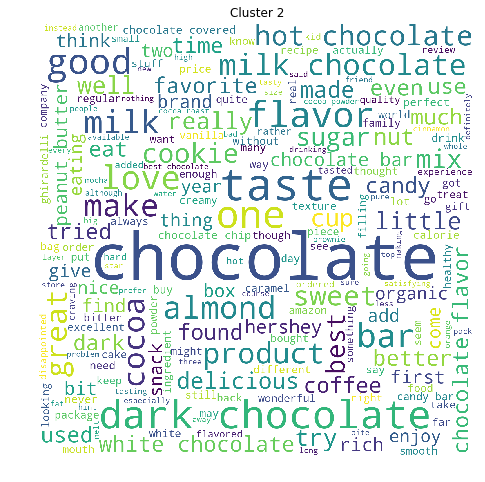

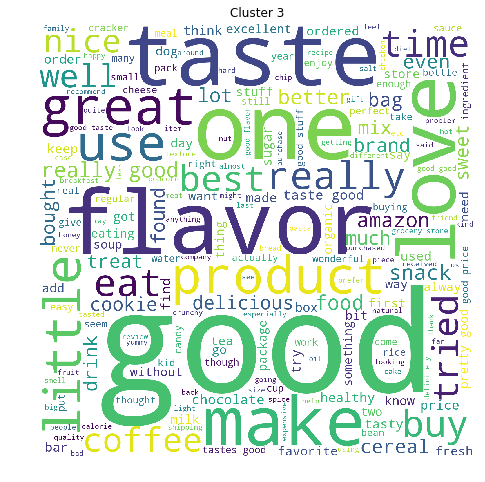

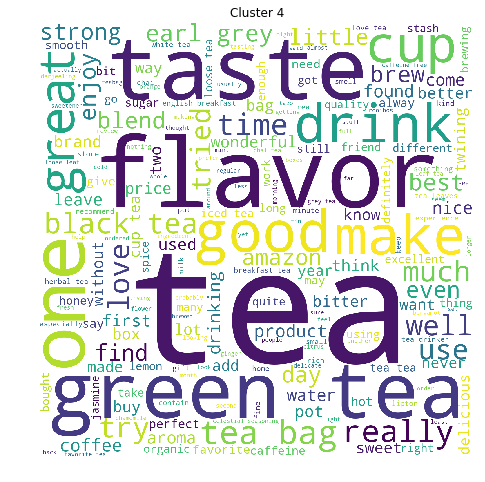

...

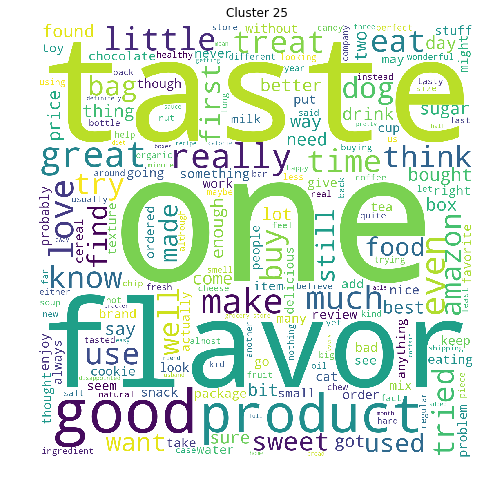

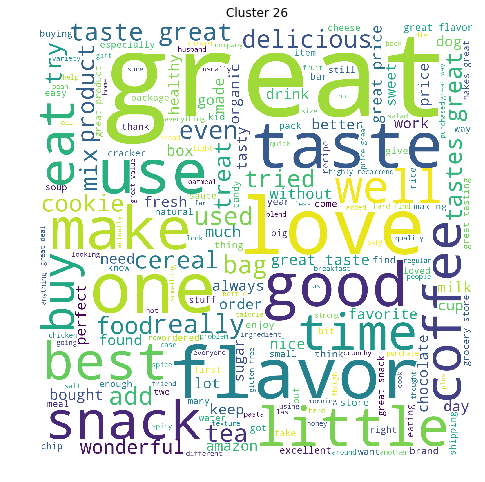

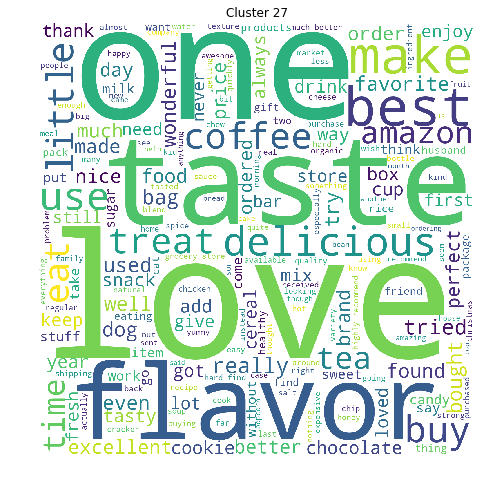

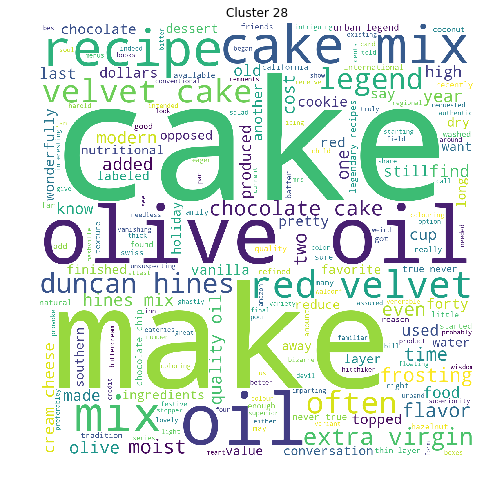

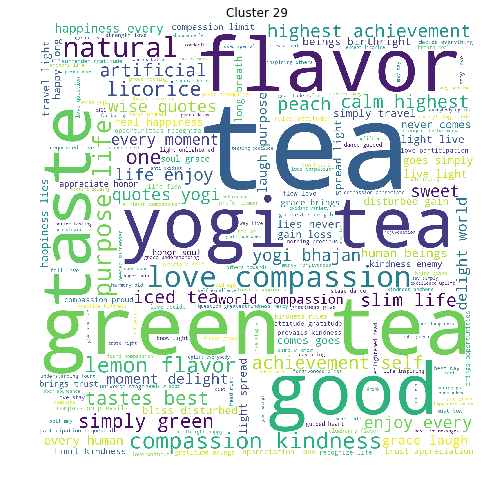

In [44]:
for i in range(30):
    word_cloud_cluster(i)

## <font color='red'> Which Cluster Represents What</font>

#### Cluster 0  - It represents reviews about Coffee Products
#### Cluster 1  - It represents reviews regarding how does a particular product tastes
#### Cluster 2  - It represents reviews of products containing Chocolate
#### Cluster 3  - It represents reviews regarding how does a particular product tastes
#### Cluster 4  - It represents reviews of Tea
#### Cluster 5  - It represents reviews of Tea
#### Cluster 6  - It represents reviews of product like sauce and soups
#### Cluster 7  - It represents reviews of ground spices
#### Cluster 8  - It represents reviews of products of sugars
#### Cluster 9  - It represents reviews of natural foods like cereals,almonds etc
#### Cluster 10- It represent reveiws of cat and dog food
#### Cluster 11- It represents reviews of green tea
#### Cluster 12- It represents reviews of beverages like juice,soda water,cold drinks
#### Cluster 13- It represents reviews of pet foods
#### Cluster 14- It represents reviews of Cheese products from velveeta brand
#### Cluster 15- It represents reviews of Tea
#### Cluster 16- It represents reviews of Chewing Gums
#### Cluster 17- It represents how customer feels after buying particular product
#### Cluster 18- It represents how customer feels after buying particular product
#### Cluster 19- It represents reviews of product like bread,cake,brownie 
#### Cluster 20- It represents reviews of dog food
#### Cluster 21- It represents how customer feels after buying particular product
#### Cluster 22- It represents reviews of Tea
#### Cluster 23- It represents reviews salt products
#### Cluster 24- It represents how customer feels after buying particular product
#### Cluster 25- It represents how customer feels after buying particular product
#### Cluster 26- It represents how customer feels after buying particular product
#### Cluster 27- It represents how customer feels after buying particular product
#### Cluster 28- It represents reviews Cake and Oils
#### Cluster 29- It represents reviews of Tea Products

### [5.1.3] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

100%|███████████████████████████████████████████████████████████████████████████████| 10/10 [1:25:09<00:00, 499.66s/it]


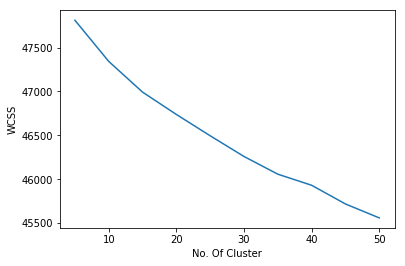

In [37]:
# Please write all the code with proper documentation
# Please write all the code with proper documentation
from sklearn.cluster import KMeans
wcss=[]
for i in tqdm(range(5,51,5)):
    kmeans=KMeans(n_clusters=i,random_state=0)
    kmeans.fit(tfidf)
    wcss.append(kmeans.inertia_)
plt.plot(range(5,51,5),wcss)
plt.xlabel('No. Of Cluster')
plt.ylabel('WCSS')
plt.show()  

#### As the plot b/w no. of cluster and within cluster sum square distance still decreasing till 50 clusters so we are taking n_cluster=20

In [39]:
from sklearn.cluster import KMeans
kmeans=KMeans(n_clusters=20,random_state=0)
kmeans.fit(tfidf)
d={'Text':preprocessed_reviews,'Label':kmeans.labels_}
df=pd.DataFrame(data=d)
df.groupby(['Label']).count()

,Text
Label,
0,2597
1,3237
2,1504
3,883
4,1083
5,797
6,2635
7,2489
8,16078


#### Cluster 8 has maxmimum 16078 Reviews

### [5.1.4] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

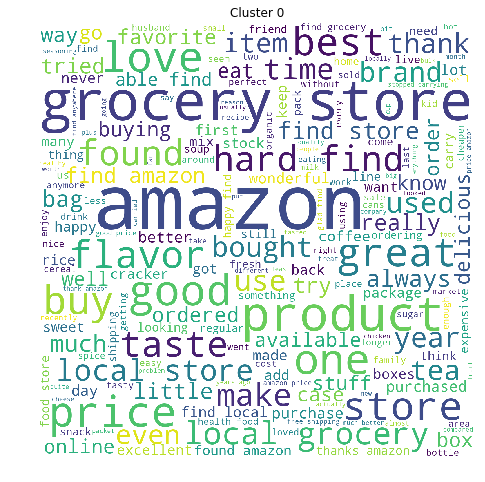

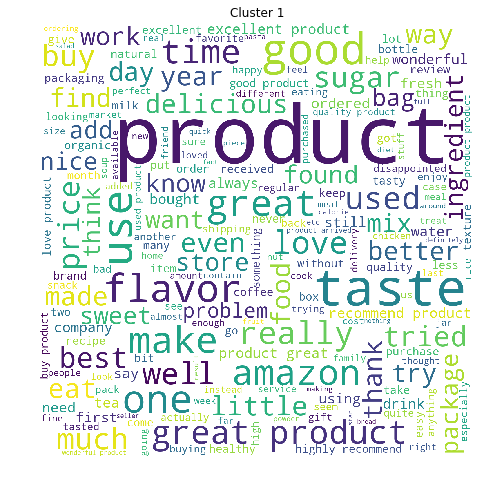

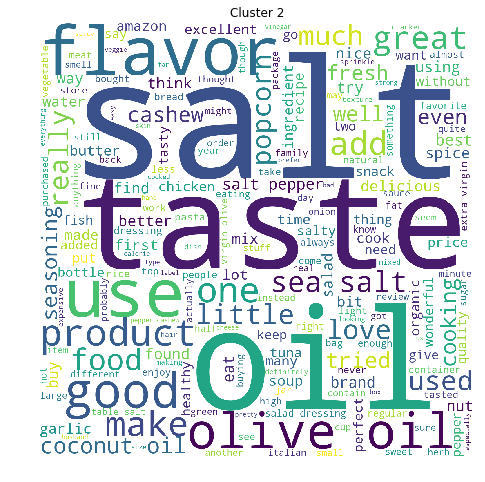

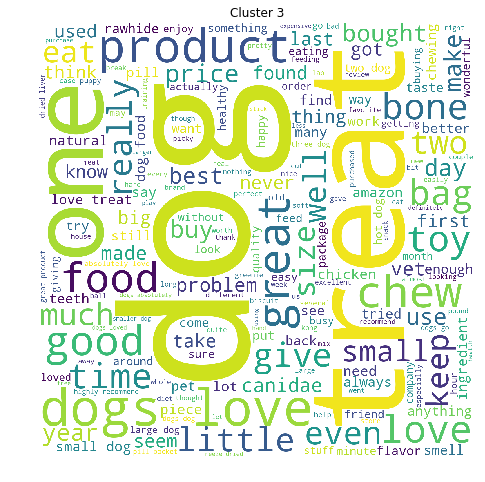

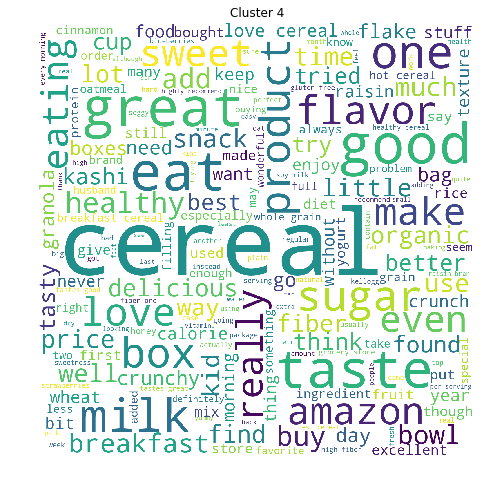

...

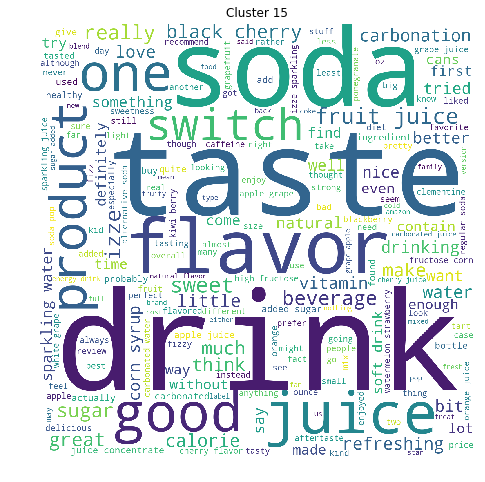

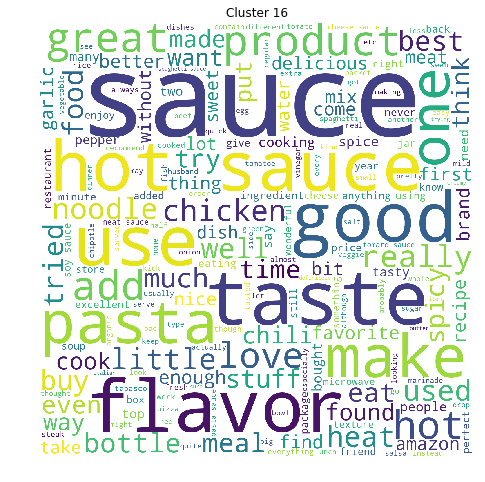

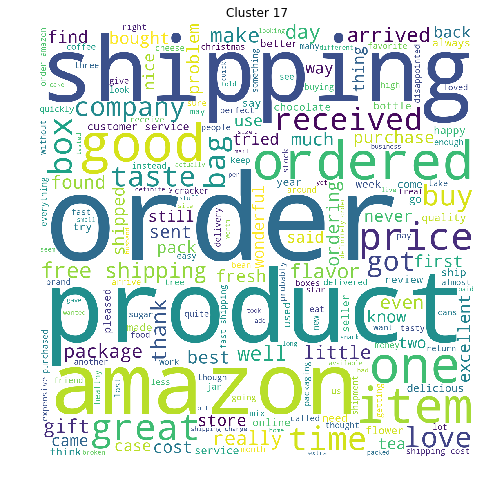

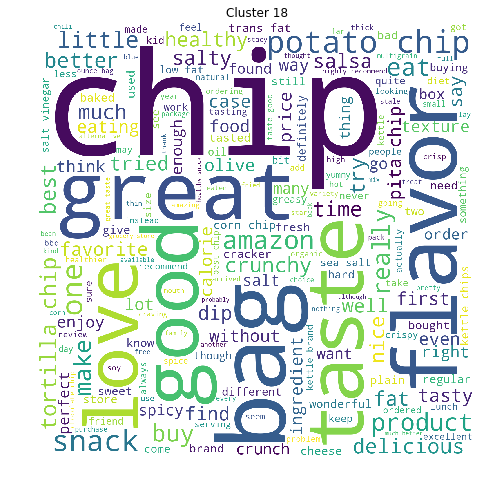

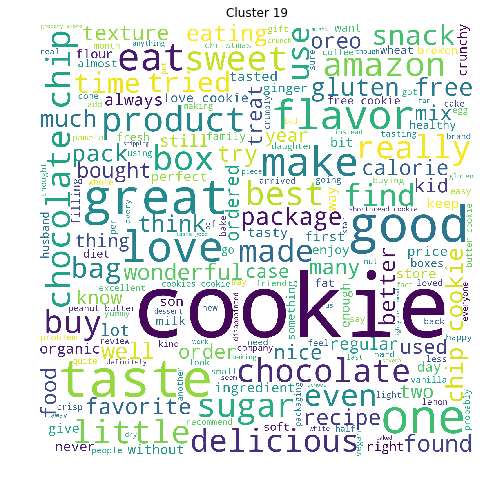

In [41]:
# Please write all the code with proper documentation
for i in range(20):
    word_cloud_cluster(i)

## <font color='red'> Which Cluster Represents What</font>

#### Cluster 0  - It represents reviews about Amazon Food Store
#### Cluster 1  - It represents reviews regarding how does a particular product is like
#### Cluster 2  - It represents reviews about products like Salt and Oils
#### Cluster 3  - It represents reviews of Dog foods
#### Cluster 4  - It represents reviews of products for breakfast like Flakes,Milk,Cereals etc
#### Cluster 5  - It represents reviews of bars like Protien bar,Gronola Bar,Candy Bar etc
#### Cluster 6  - It represents reviews of Coffee Products
#### Cluster 7  - It represents reviews regarding how does a particular product is like
#### Cluster 8  - It represents reviews regarding how does a particular product is like
#### Cluster 9  - It represents reviews regarding how does a particular product is like
#### Cluster 10- It represents reviews of Tea
#### Cluster 11- It represents reviews of products containing Chocolate
#### Cluster 12- It represents reviews of pet foods 
#### Cluster 13- It represents reviews of candy, bars 
#### Cluster 14- It represents reviews of product like bread,cake,brownie 
#### Cluster 15- It represents reviews of beverages like juice,soda water,cold drinks
#### Cluster 16- It represents reveiws of products like sauces, noodles,pasta,chicken
#### Cluster 17- It represents reviews about shipping, product quality
#### Cluster 18- It represents reviews of Chips like Potato Chips,Pita Chips,Tortilla Chips etc
#### Cluster 19- It represents reviews of products like Cookies,Choco Chips etc


### [5.1.5] Applying K-Means Clustering on AVG W2V,<font color='red'> SET 3</font>

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [07:00<00:00, 59.81s/it]


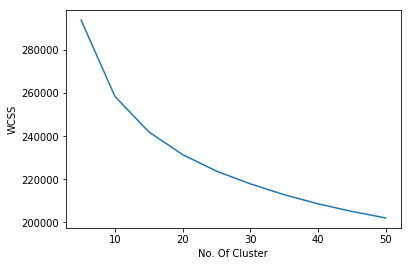

In [38]:
# Please write all the code with proper documentation
# Please write all the code with proper documentation
from sklearn.cluster import KMeans
wcss=[]
for i in tqdm(range(5,51,5)):
    kmeans=KMeans(n_clusters=i,random_state=0)
    kmeans.fit(sent_vectors)
    wcss.append(kmeans.inertia_)
plt.plot(range(5,51,5),wcss)
plt.xlabel('No. Of Cluster')
plt.ylabel('WCSS')
plt.show()  

#### As the plot b/w no. of cluster and within cluster sum square distance still decreasing till 50 clusters so we are taking n_cluster=20

In [46]:
from sklearn.cluster import KMeans
kmeans=KMeans(n_clusters=20,random_state=0)
kmeans.fit(sent_vectors)
d={'Text':preprocessed_reviews,'Label':kmeans.labels_}
df=pd.DataFrame(data=d)
df.groupby(['Label']).count()

,Text
Label,
0,2391
1,3496
2,1623
3,3356
4,2060
5,3027
6,4185
7,1417
8,1924


#### Cluster 6 has maximum 4185 reviews

### [5.1.6] Wordclouds of clusters obtained after applying k-means on AVG W2V<font color='red'> SET 3</font>

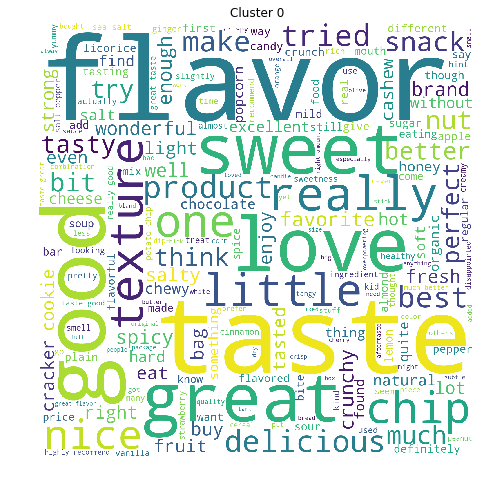

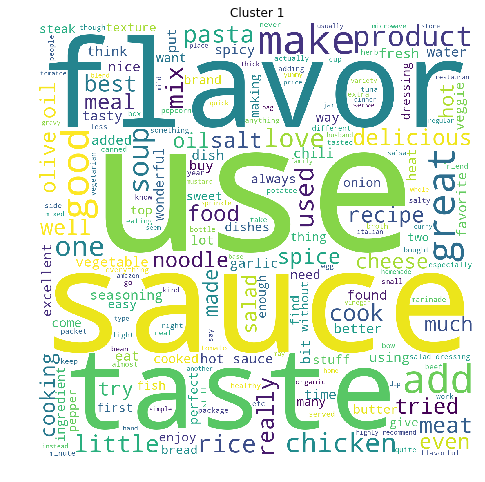

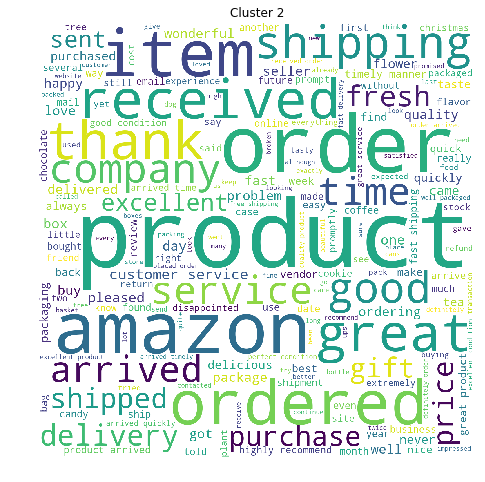

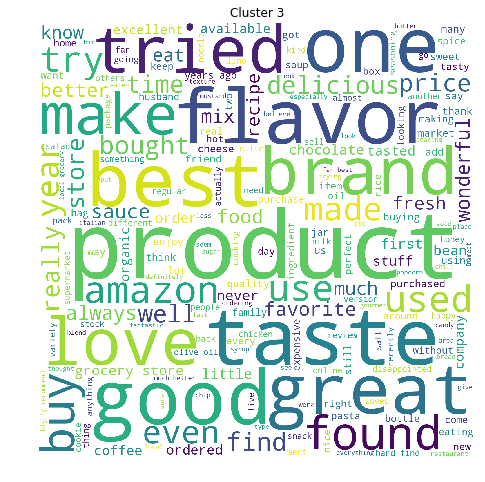

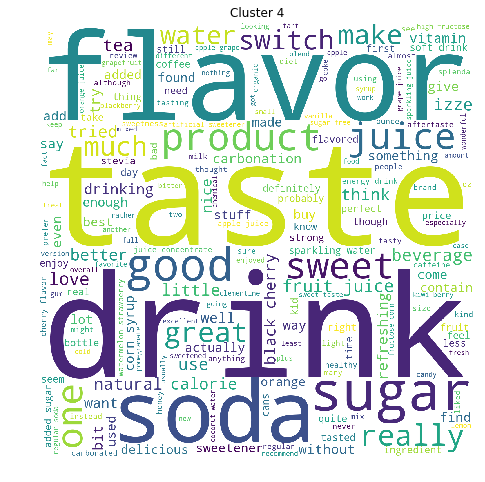

...

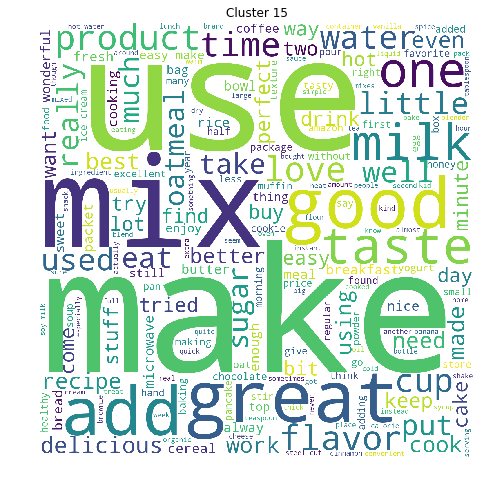

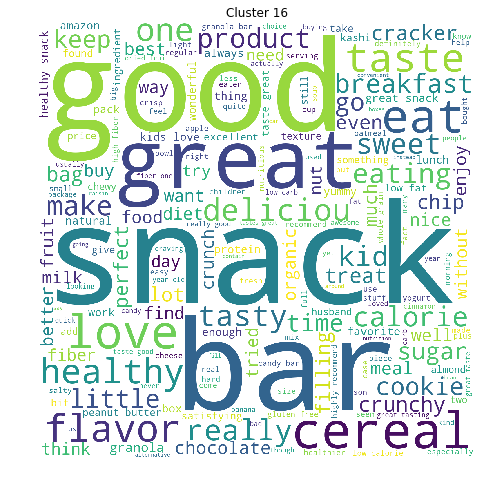

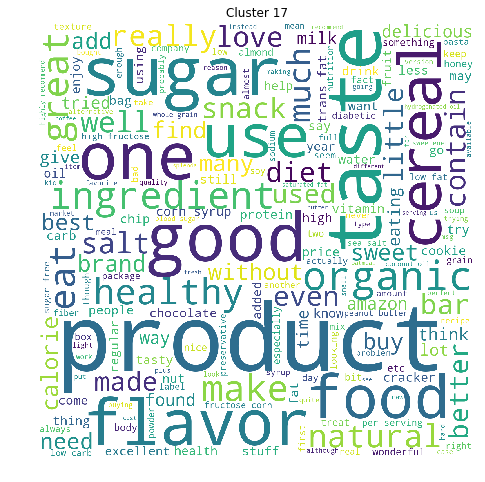

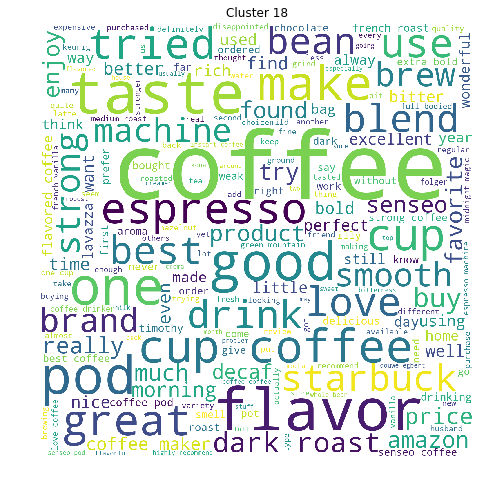

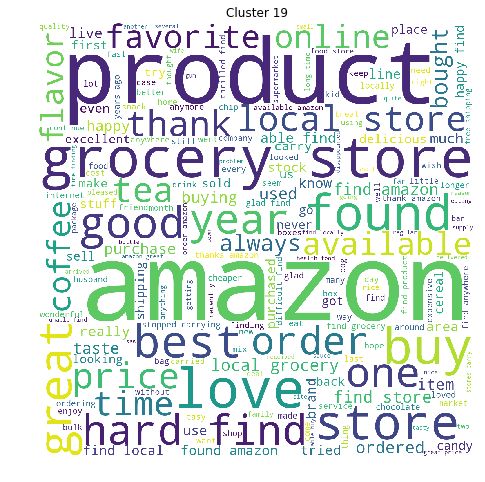

In [47]:
# Please write all the code with proper documentation
for i in range(20):
    word_cloud_cluster(i)

## <font color='red'> Which Cluster Represents What</font>

#### Cluster 0  - It represents reviews about snacks products 
#### Cluster 1  - It represents reveiws of products like sauces, noodles,pasta,chicken
#### Cluster 2  - It represents reviews about Delivery system of Amazon
#### Cluster 3  - It represents how customer feels after buying particular product
#### Cluster 4  - It represents reviews of beverages like juice,soda water,cold drinks
#### Cluster 5  - It represents reviews of cat and dog food
#### Cluster 6  - It represents how customer feels after buying particular product
#### Cluster 7  - It represents reviews of products containing Chocolate
#### Cluster 8  - It represents reviews of Tea Products
#### Cluster 9  - It represents how customer feels after buying particular product
#### Cluster 10- It represents reviews of Tea and Coffee Products
#### Cluster 11- It represents reviews of product like bread,cake,brownie 
#### Cluster 12- It represents reviews of products that are used as a gift for someone else
#### Cluster 13- It represents reviews of packaging of products by amazon
#### Cluster 14- It represents reviews about Amazon Store how's there service
#### Cluster 15- It represents reviews of products that are used with milk
#### Cluster 16- It represents reveiws of snacks like bar,cereals,cookies
#### Cluster 17- It represents reviews of products that are healthy and organinc like cereals
#### Cluster 18- It represents reviews of Coffee Products
#### Cluster 19- It represents reviews about Amazon Grocery store 


### [5.1.7] Applying K-Means Clustering on TFIDF W2V,<font color='red'> SET 4</font>

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [06:10<00:00, 52.28s/it]


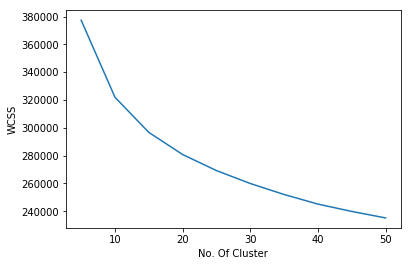

In [39]:
# Please write all the code with proper documentation
# Please write all the code with proper documentation
from sklearn.cluster import KMeans
wcss=[]
for i in tqdm(range(5,51,5)):
    kmeans=KMeans(n_clusters=i,random_state=0)
    kmeans.fit(tfidf_sent_vectors)
    wcss.append(kmeans.inertia_)
plt.plot(range(5,51,5),wcss)
plt.xlabel('No. Of Cluster')
plt.ylabel('WCSS')
plt.show()  

In [48]:
from sklearn.cluster import KMeans
kmeans=KMeans(n_clusters=20,random_state=0)
kmeans.fit(tfidf_sent_vectors)
d={'Text':preprocessed_reviews,'Label':kmeans.labels_}
df=pd.DataFrame(data=d)
df.groupby(['Label']).count()

,Text
Label,
0,2789
1,2571
2,1006
3,2350
4,5302
5,2222
6,2745
7,3384
8,1296


### [5.1.8] Wordclouds of clusters obtained after applying k-means on TFIDF W2V<font color='red'> SET 4</font>

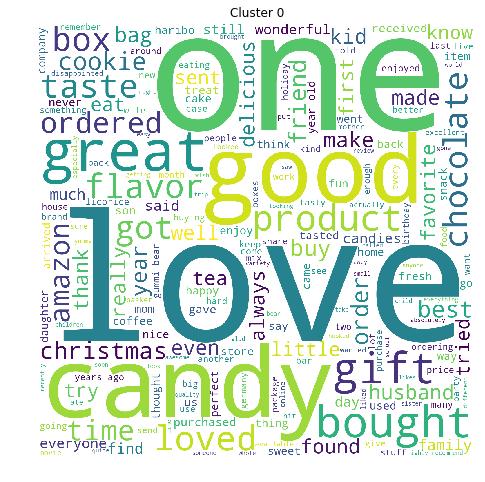

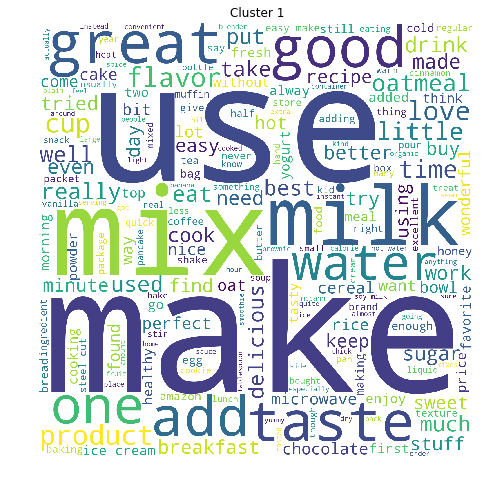

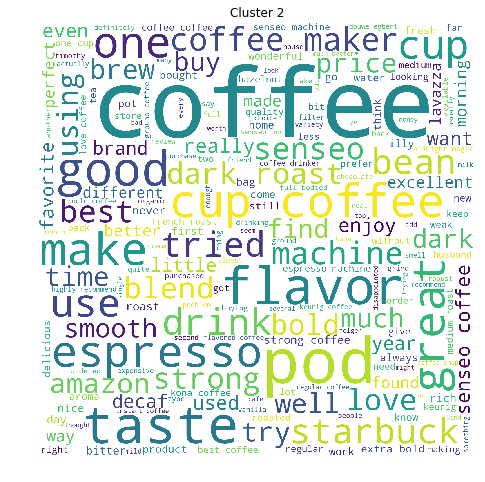

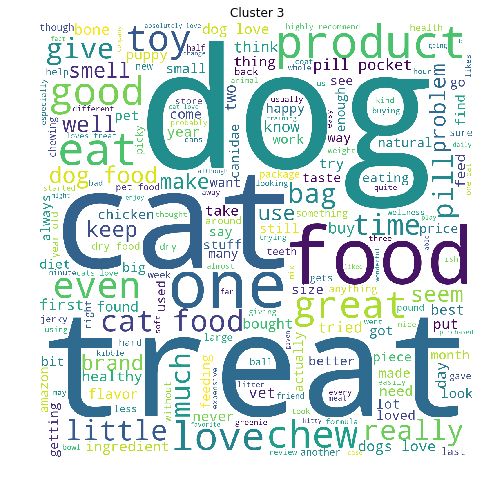

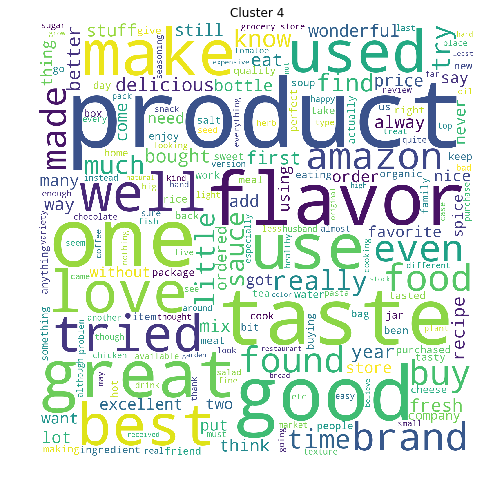

...

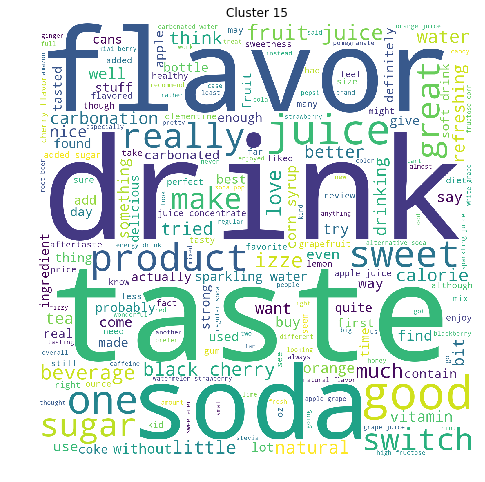

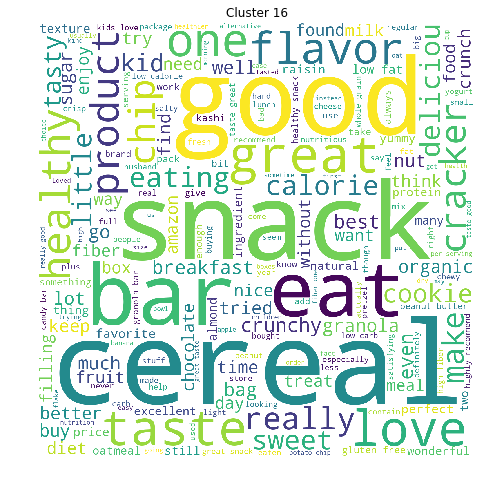

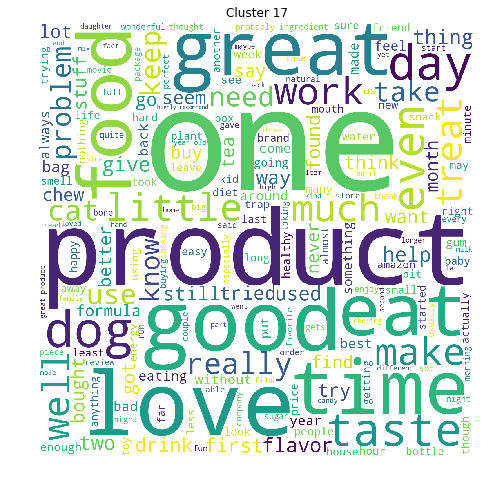

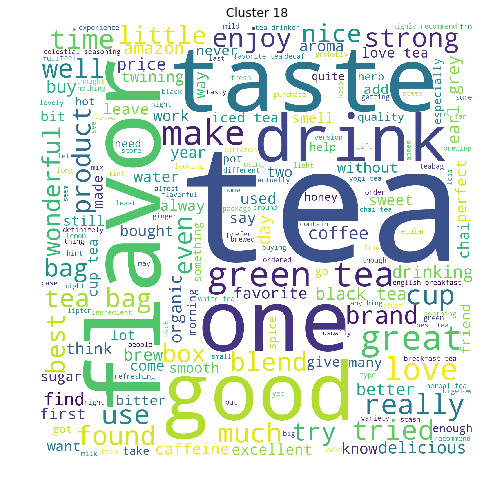

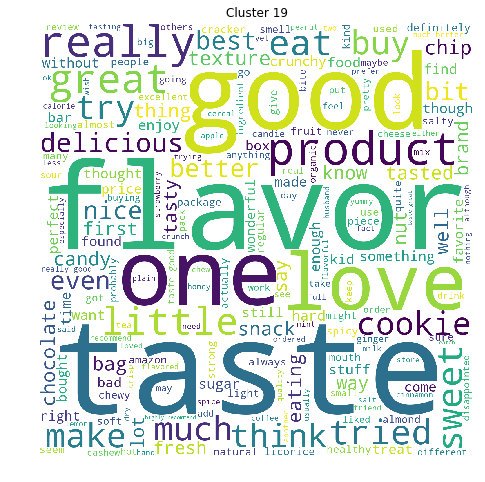

In [49]:
# Please write all the code with proper documentation
for i in range(20):
    word_cloud_cluster(i)

## <font color='red'> Which Cluster Represents What</font>

#### Cluster 0  - It represents how customer feels after buying particular product
#### Cluster 1  - It represents reveiws of breakfast food like cereals,oatsmeal
#### Cluster 2  - It represents reviews of Coffee Products
#### Cluster 3  - It represents reviews of Cat and Dog Food
#### Cluster 4  - It represents how customer feels after buying particular product
#### Cluster 5  - It represents reviews of Coffee Products
#### Cluster 6  - It represents reviews about Amazon Grocery Store
#### Cluster 7  - It represents reveiws of products like sauces, noodles,pasta,chicken
#### Cluster 8  - It represents reviews of Tea Products
#### Cluster 9  - It represents reviews of Chocolate Products
#### Cluster 10- It represents reviews of Products of Sugar and Honey
#### Cluster 11- It represents reviews of product like bread,cake,brownie 
#### Cluster 12- It represents reviews of Packaging of Products delivered
#### Cluster 13- It represents reviews of Products of Salt and Oils
#### Cluster 14- It represents reviews about Delivery System of Amazon 
#### Cluster 15- It represents reviews of beverages like juice,soda water,cold drinks
#### Cluster 16- It represents reveiws of snacks like bar,cereals,cookies
#### Cluster 17- It represents how customer feels after buying particular product
#### Cluster 18- It represents reviews of Tea Products
#### Cluster 19- It represents how customer feels after buying particular product


## [5.2] Agglomerative Clustering

### AVGW2V and TFIDF Vectors for 5000 Data

In [115]:
# Please write all the code with proper documentation
# Train your own Word2Vec model using your own text corpus
preprocessed_reviews=preprocessed_reviews[:5000]
i=0
list_of_sentance=[]
for sentance in preprocessed_reviews:
    list_of_sentance.append(sentance.split())
# Using Google News Word2Vectors

# in this project we are using a pretrained model by google
# its 3.3G file, once you load this into your memory 
# it occupies ~9Gb, so please do this step only if you have >12G of ram
# we will provide a pickle file wich contains a dict , 
# and it contains all our courpus words as keys and  model[word] as values
# To use this code-snippet, download "GoogleNews-vectors-negative300.bin" 
# from https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit
# it's 1.9GB in size.


# http://kavita-ganesan.com/gensim-word2vec-tutorial-starter-code/#.W17SRFAzZPY
# you can comment this whole cell
# or change these varible according to your need

is_your_ram_gt_16g=False
want_to_use_google_w2v = False
want_to_train_w2v = True

if want_to_train_w2v:
    # min_count = 5 considers only words that occured atleast 5 times
    w2v_model=Word2Vec(list_of_sentance,min_count=5,size=50, workers=4)
    print(w2v_model.wv.most_similar('great'))
    print('='*50)
    print(w2v_model.wv.most_similar('worst'))
    
elif want_to_use_google_w2v and is_your_ram_gt_16g:
    if os.path.isfile('GoogleNews-vectors-negative300.bin'):
        w2v_model=KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
        print(w2v_model.wv.most_similar('great'))
        print(w2v_model.wv.most_similar('worst'))
    else:
        print("you don't have gogole's word2vec file, keep want_to_train_w2v = True, to train your own w2v ")
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])
# average Word2Vec
# compute average word2vec for each review.
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

import pickle
# average Word2Vec
# compute average word2vec for each review.
if os.path.isfile('tfidf_sent_vectors_2.pkl'):
    with open('tfidf_sent_vectors_2.pkl', 'rb') as f:
        tfidf_sent_vectors= pickle.load(f)
else:
    model = TfidfVectorizer()
    tf_idf_matrix = model.fit_transform(preprocessed_reviews)
    # we are converting a dictionary with word as a key, and the idf as a value
    dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))
    # TF-IDF weighted Word2Vec
    tfidf_feat = model.get_feature_names() # tfidf words/col-names
    # final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

    tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
    row=0;
    for sent in tqdm(list_of_sentance): # for each review/sentence 
        sent_vec = np.zeros(50) # as word vectors are of zero length
        weight_sum =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words and word in tfidf_feat:
                vec = w2v_model.wv[word]
    #             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
                # to reduce the computation we are 
                # dictionary[word] = idf value of word in whole courpus
                # sent.count(word) = tf valeus of word in this review
                tf_idf = dictionary[word]*(sent.count(word)/len(sent))
                sent_vec += (vec * tf_idf)
                weight_sum += tf_idf
        if weight_sum != 0:
            sent_vec /= weight_sum
        tfidf_sent_vectors.append(sent_vec)
        row += 1
    with open('tfidf_sent_vectors_2.pkl', 'wb') as f:
        pickle.dump(tfidf_sent_vectors, f)

[('pretty', 0.9865176677703857), ('acquire', 0.9858213663101196), ('spaghetti', 0.985622227191925), ('chipotle', 0.9851055145263672), ('anything', 0.9846747517585754), ('tabasco', 0.9845499992370605), ('chewy', 0.9845120906829834), ('liking', 0.9843518733978271), ('cereal', 0.9842771291732788), ('insanity', 0.9841344356536865)]
[('pop', 0.9995596408843994), ('honestly', 0.9994063377380371), ('enjoyed', 0.9993314146995544), ('admit', 0.9992393255233765), ('salmon', 0.9992251992225647), ('hands', 0.9991985559463501), ('folks', 0.9991958141326904), ('call', 0.9991859793663025), ('eaten', 0.9991282224655151), ('wow', 0.9991274476051331)]
number of words that occured minimum 5 times  5055
sample words  ['little', 'book', 'makes', 'son', 'laugh', 'loud', 'car', 'driving', 'along', 'always', 'sing', 'learned', 'india', 'roses', 'love', 'new', 'words', 'classic', 'willing', 'bet', 'still', 'able', 'memory', 'college', 'remember', 'seeing', 'show', 'television', 'years', 'ago', 'child', 'sister

100%|█████████████████████████████████████████████████████████████████████████████| 5000/5000 [00:09<00:00, 520.51it/s]


5000
50


100%|██████████████████████████████████████████████████████████████████████████████| 5000/5000 [01:28<00:00, 56.46it/s]


### [5.2.1] Applying Agglomerative Clustering on AVG W2V With 2 Clusters,<font color='red'> SET 3</font>

In [116]:
from sklearn.cluster import AgglomerativeClustering

In [117]:
model=AgglomerativeClustering(n_clusters=2)
model.fit(sent_vectors)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=2,
            pooling_func=<function mean at 0x000002735A794F28>)

In [118]:
d={'Text':preprocessed_reviews,'Label':model.labels_}
df=pd.DataFrame(data=d)
df.groupby(['Label']).count()

,Text
Label,
0,3688
1,1312


### [5.2.2] Wordclouds of clusters obtained after applying Agglomerative Clustering on AVG W2V With 2 Cluster<font color='red'> SET 3</font>

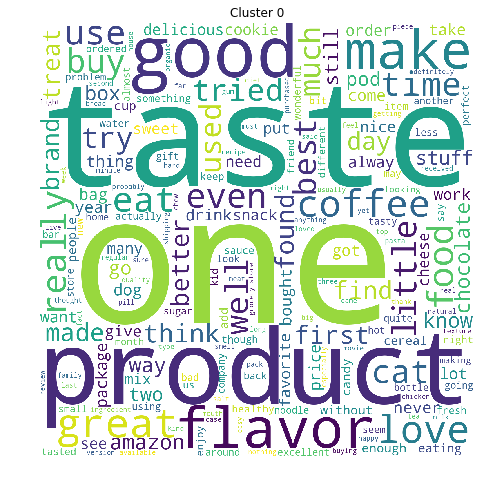

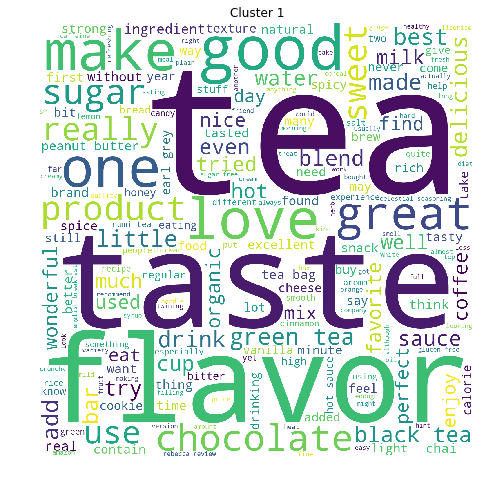

In [119]:
# Please write all the code with proper documentation
for i in range(2):
    word_cloud_cluster(i)

#### As we have used only 2 Clusters we can see that a lot of words of different categories are in Word Cloud 

### [5.2.1] Applying Agglomerative Clustering on AVG W2V With 5 Clusters,<font color='red'> SET 3</font>

In [120]:
model=AgglomerativeClustering(n_clusters=5)
model.fit(sent_vectors)
d={'Text':preprocessed_reviews,'Label':model.labels_}
df=pd.DataFrame(data=d)
df.groupby(['Label']).count()

,Text
Label,
0,1768
1,476
2,1063
3,857
4,836


### [5.2.2] Wordclouds of clusters obtained after applying Agglomerative Clustering on AVG W2V With 5 Cluster<font color='red'> SET 3</font>

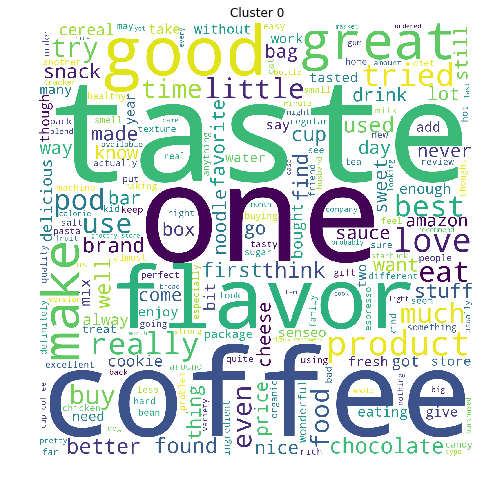

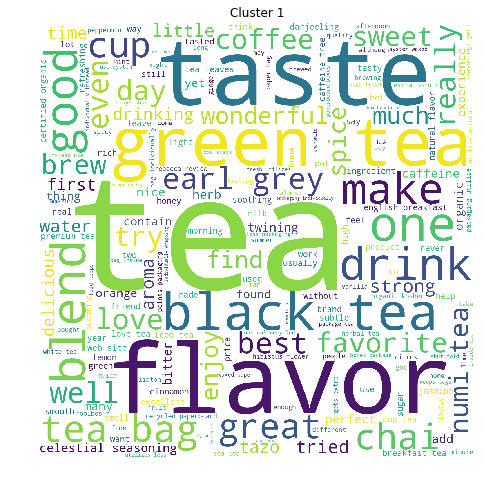

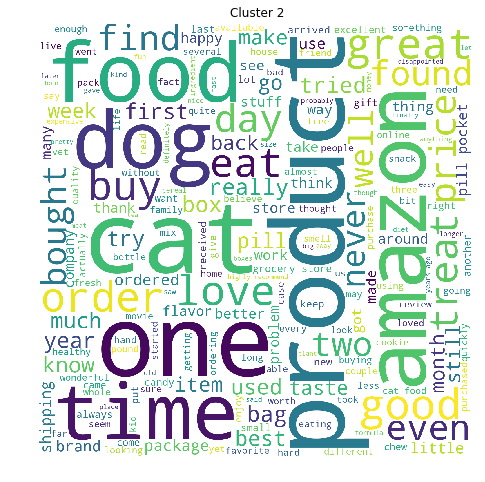

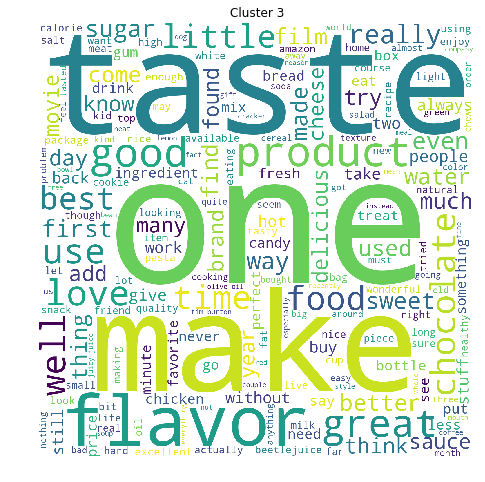

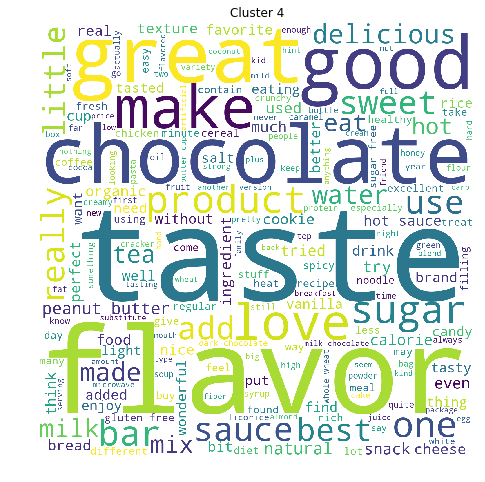

In [121]:
for i in range(5):
    word_cloud_cluster(i)

#### Here with 5 Clusters we can see particular words are dominating a particular Category of review
#### Cluster 0  - It represents of Coffee Products
#### Cluster 1  - It represents reveiws of Tea Products
#### Cluster 2  - It represents reviews of Cat and Dog Food
#### Cluster 3  - It represents how customer feels after buying particular product
#### Cluster 4  - It represents reviews of Chocolate,Butter,Sauces,Cheese Products

### [5.2.3] Applying Agglomerative Clustering on TFIDF W2V with 2 Clusters,<font color='red'> SET 4</font>

In [122]:
# Please write all the code with proper documentation
model=AgglomerativeClustering(n_clusters=2)
model.fit(tfidf_sent_vectors)
d={'Text':preprocessed_reviews,'Label':model.labels_}
df=pd.DataFrame(data=d)
df.groupby(['Label']).count()

,Text
Label,
0,2008
1,2992


### [5.2.4] Wordclouds of clusters obtained after applying Agglomerative Clustering on TFIDF W2V with 2 Clusters<font color='red'> SET 4</font>

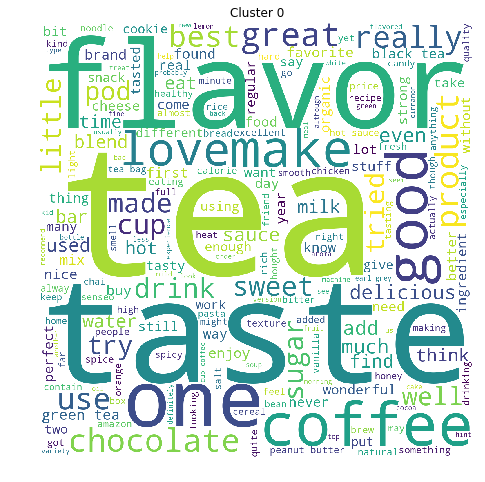

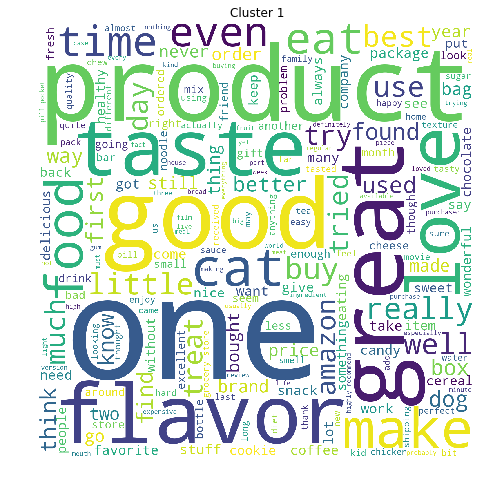

In [123]:
# Please write all the code with proper documentation
for i in range(2):
    word_cloud_cluster(i)

#### As we have used only 2 Clusters we can see that a lot of words of different categories are in Word Cloud 

### [5.2.3] Applying Agglomerative Clustering on TFIDF W2V with 5 Clusters,<font color='red'> SET 4</font>

In [124]:
# Please write all the code with proper documentation
model=AgglomerativeClustering(n_clusters=5)
model.fit(tfidf_sent_vectors)
d={'Text':preprocessed_reviews,'Label':model.labels_}
df=pd.DataFrame(data=d)
df.groupby(['Label']).count()

,Text
Label,
0,1806
1,1547
2,207
3,1186
4,254


### [5.2.4] Wordclouds of clusters obtained after applying Agglomerative Clustering on TFIDF W2V with 5 Clusters<font color='red'> SET 4</font>

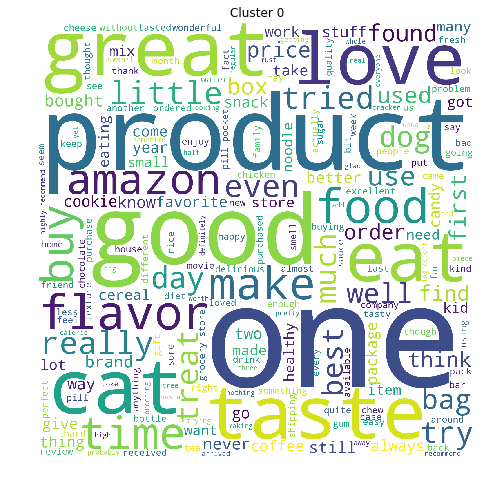

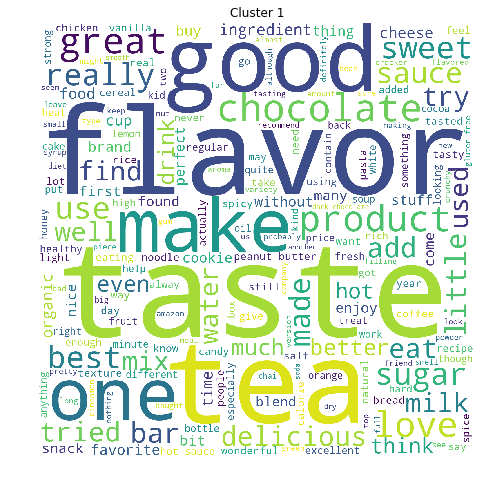

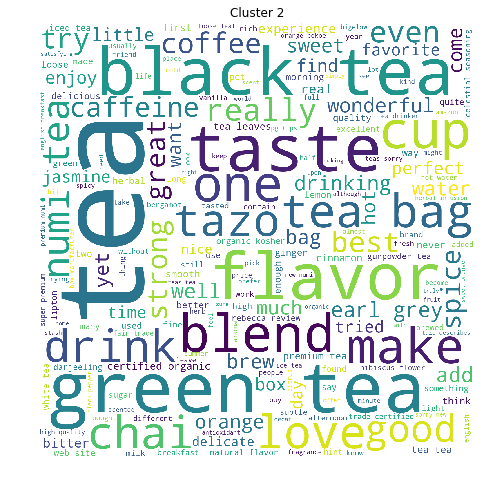

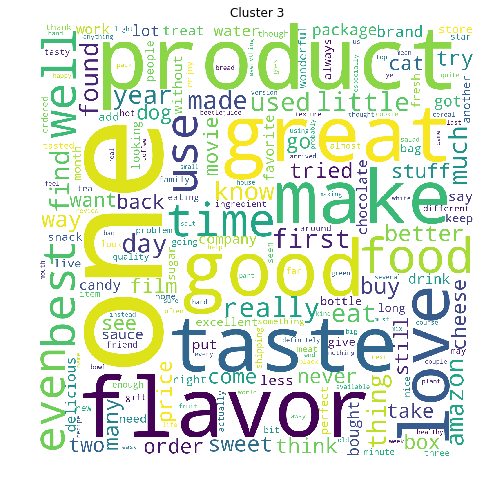

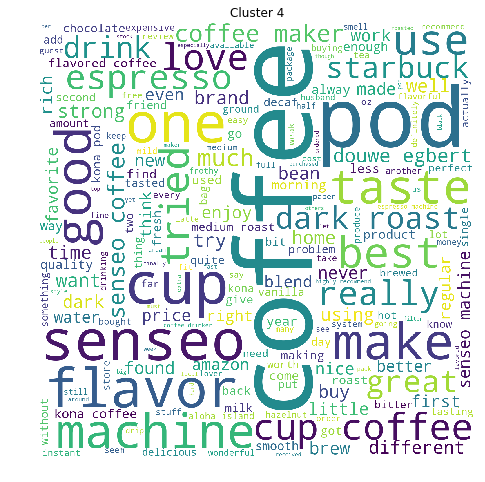

In [125]:
# Please write all the code with proper documentation
for i in range(5):
    word_cloud_cluster(i)

#### Here with 5 Clusters we can see particular words are dominating a particular Category of review
#### Cluster 0  - It represents how customer feels after buying particular product
#### Cluster 1  - It represents reveiws of Products that tastes sweet
#### Cluster 2  - It represents reviews Tea Products
#### Cluster 3  - It represents how customer feels after buying particular product
#### Cluster 4  - It represents reviews of Coffee Products

## [5.3] DBSCAN Clustering

### [5.3.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>

In [126]:
len(preprocessed_reviews)

5000

In [131]:
# Please write all the code with proper documentation
# Function returns the distance of given point to the given neighbour point
def distance_n_neighbour(data,n):
    distance=[]
    for i in data:
        k=np.sort(np.sum((data-i)**2,axis=1),axis=None)
        distance.append(k[n])
    return (np.array(distance))

Text(0.5,1,'Elbow Method to determine Eps')

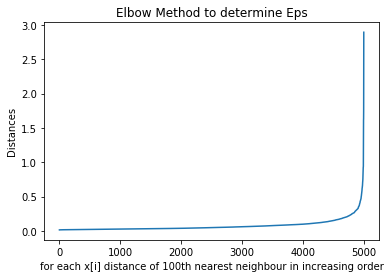

In [132]:
min_pts=100 # Twice of the Dimensions(Thumb Rule)
distances=np.sort(distance_n_neighbour(sent_vectors,min_pts))
points=[i for i in range(5000)]
plt.plot(points,distances)
plt.xlabel('for each x[i] distance of 100th nearest neighbour in increasing order')
plt.ylabel('Distances')
plt.title('Elbow Method to determine Eps')

#### By Knee Method we get Epsilon=0.25

In [135]:
from sklearn.cluster import DBSCAN
model=DBSCAN(eps=0.25,min_samples=100)
model.fit(sent_vectors)
d={'Text':preprocessed_reviews,'Label':model.labels_ }
df=pd.DataFrame(data=d)
df.groupby(['Label']).count()

,Text
Label,
-1,728
0,4272


#### -1 Represents Noisy Points so there are 728 Noisy point in our 5000 Dataset

### [5.3.2] Wordclouds of clusters obtained after applying DBSCAN on AVG W2V<font color='red'> SET 3</font>

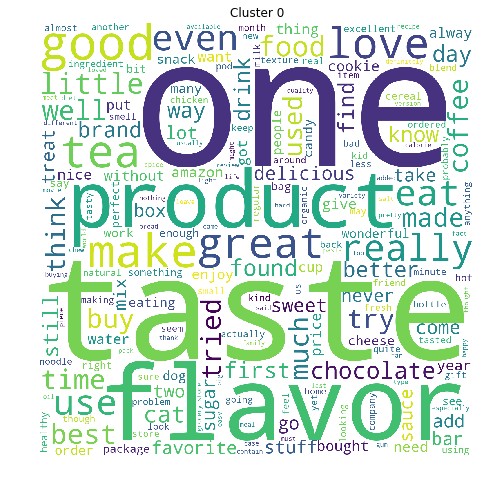

In [136]:
# Please write all the code with proper documentation
word_cloud_cluster(0)

#### As Our dataset is very small so DBSCAN has produced only 1 Cluster

### [5.3.3] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

Text(0.5,1,'Elbow Method to determine Eps')

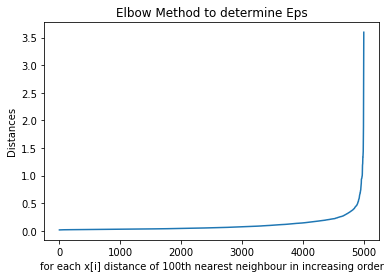

In [137]:
# Please write all the code with proper documentation
min_pts=100
distances=np.sort(distance_n_neighbour(tfidf_sent_vectors,min_pts))
points=[i for i in range(5000)]
plt.plot(points,distances)
plt.xlabel('for each x[i] distance of 100th nearest neighbour in increasing order')
plt.ylabel('Distances')
plt.title('Elbow Method to determine Eps')

#### By Knee Method we get Epsilon=0.4

In [138]:
from sklearn.cluster import DBSCAN
model=DBSCAN(eps=0.4,min_samples=100)
model.fit(tfidf_sent_vectors)
d={'Text':preprocessed_reviews,'Label':model.labels_ }
df=pd.DataFrame(data=d)
df.groupby(['Label']).count()

,Text
Label,
-1,202
0,4798


#### -1 Represents Noisy Points so there are 202 Noisy point in our 5000 Dataset

### [5.3.4] Wordclouds of clusters obtained after applying DBSCAN on TFIDF W2V<font color='red'> SET 4</font>

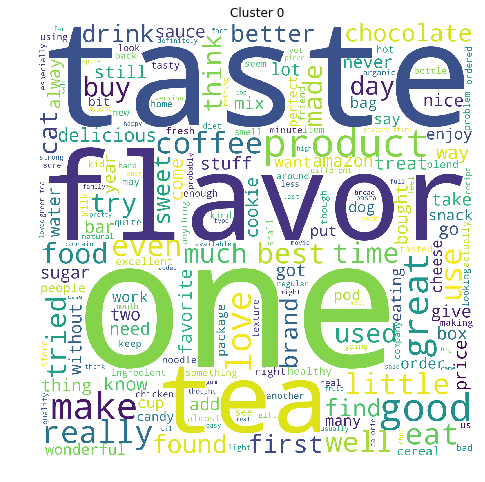

In [139]:
# Please write all the code with proper documentation
word_cloud_cluster(0)

#### As Our dataset is very small so DBSCAN has produced only 1 Cluster

# [6] Conclusions

In [3]:
# Please compare all your models using Prettytable library. 
from prettytable import PrettyTable
    
x = PrettyTable()


x.field_names = ["Model", "No. Cluster"]

x.add_row(["K-Means BOW","30",])
x.add_row(["K-Means TFIDF","20",])
x.add_row(["K-Means AVGW2V","20",])
x.add_row(["K-Means TFIDFW2V","20",])
x.add_row(["Agllomerative AVGW2V","2,5",])
x.add_row(["Agllomerative TFIDFW2V","2,5",])
x.add_row(["DBSCAN AVGW2V","1",])
x.add_row(["DBSCAN TFIDFW2V","1",])
print(x)

+------------------------+-------------+
|         Model          | No. Cluster |
+------------------------+-------------+
|      K-Means BOW       |      30     |
|     K-Means TFIDF      |      20     |
|     K-Means AVGW2V     |      20     |
|    K-Means TFIDFW2V    |      20     |
|  Agllomerative AVGW2V  |     2,5     |
| Agllomerative TFIDFW2V |     2,5     |
|     DBSCAN AVGW2V      |      1      |
|    DBSCAN TFIDFW2V     |      1      |
+------------------------+-------------+


#### As We have used 50K Datapoints in KMEANS so it is working really well and able to categorize most of the reviews in different clusters but in Agllomerative we have used only 5K datapoints so when se use 2 clusters in Agllomerative we get bad results but with 5 Clusters it is able to categorize reviews into clusters and In DBSCAN due to 5K Datapoints it is forming only 1 Cluster which is not good 